In [1]:
# Imports
import time
from google import genai
from google.genai import types


In [ ]:
# API Key and client
GOOGLE_API_KEY = ""
client = genai.Client(api_key=GOOGLE_API_KEY)  # read API key from GOOGLE_API_KEY


In [18]:
# Prompt

video_prompt = "A breathtaking, ultra-realistic vista of a lush, vibrant sky island floating serenely amidst swirling, iridescent clouds. The island's base is obscured by ethereal mist that gently glows with an inner light, hinting at unseen waterfalls cascading into the cloudscape below. Dominating the island is an ancient, gnarled banyan tree with roots that intertwine and cascade over the edge, adorned with luminous, bioluminescent orchids of various pastel hues. Sunlight, diffused by the swirling clouds, bathes the scene in a soft, warm, golden light, creating dappled patterns on the verdant foliage. Tiny, crystalline streams meander through moss-covered rocks, their gentle murmur barely audible. Butterflies with opalescent wings flutter lazily among the flowers, their movements slow and graceful. The air is thick with the scent of damp earth, blooming flowers, and a faint, ozonic tang from the passing clouds. Render in the style of a photorealistic matte painting, emphasizing detail, depth of field, and atmospheric perspective. The overall mood should be peaceful, contemplative, and otherworldly, evoking a sense of tranquility and boundless space, reminiscent of a dreamlike sanctuary for meditation., 8k resolution, 3D render, ray traced, blankets, warm lighting, pillows, natural light, calm, zen, artgerm, artstation trending, Greg Rutkowski panarama view"

In [19]:
#Prompt to video

operation = client.models.generate_videos(
    model="veo-2.0-generate-001",
    prompt=video_prompt,
    config=types.GenerateVideosConfig(
        person_generation="dont_allow",  # "dont_allow" or "allow_adult"
        aspect_ratio="16:9",  # "16:9" or "9:16"
        number_of_videos=1,
        duration_seconds=5,
    ),
)

while not operation.done:
    time.sleep(20)
    operation = client.operations.get(operation)

print("Operation done")
print(operation.result.generated_videos)

Operation done
[GeneratedVideo(video=Video(uri=https://generativelanguage.googleapis.com/v1beta/files/qsc1qng2szda:download?alt=media, video_bytes=None, mime_type=None)), GeneratedVideo(video=Video(uri=https://generativelanguage.googleapis.com/v1beta/files/4h0lj7j8qjdm:download?alt=media, video_bytes=None, mime_type=None))]


In [20]:
for n, generated_video in enumerate(operation.result.generated_videos):
  client.files.download(file=generated_video.video)
  generated_video.video.save(f'video{n}.mp4') # Saves the video(s)
  display(generated_video.video.show())

None

None

In [30]:
# Prompt and image to video

prompt="Point of view on an island on a floating island"

images = client.models.generate_images(
    model="imagen-3.0-generate-002",
    prompt=prompt,
    config=types.GenerateImagesConfig(
      aspect_ratio="16:9",
      number_of_images=1
    )
)


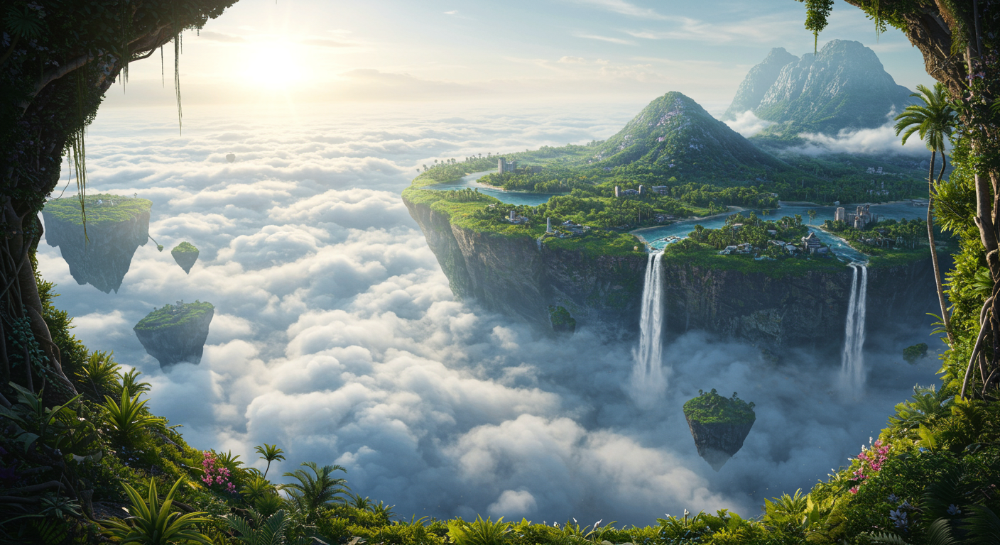

In [31]:
images.generated_images[0].image.show()


In [40]:
# image to video

prompt1 = "point of view from left to right 360"

operation1 = client.models.generate_videos(
    model="veo-2.0-generate-001",
    prompt=prompt1,
    image = images.generated_images[0].image,
    config=types.GenerateVideosConfig(
      # person_generation only accepts "dont_allow" for image-to-video
      aspect_ratio="16:9",  # "16:9" or "9:16"
      number_of_videos=1
    ),
)

# Wait for videos to generate
while not operation1.done:
  time.sleep(20)
  operation = client.operations.get(operation)


KeyboardInterrupt: 

In [ ]:
for n, video in enumerate(operation.response.generated_videos):
    fname = f'with_image_input{n}.mp4'
    print(fname)
    video.save(fname)

In [ ]:
for n, generated_video in enumerate(operation.result.generated_videos):
  client.files.download(file=generated_video.video)
  generated_video.video.save(f'video{n}.mp4') # Saves the video(s)
  display(generated_video.video.show())